# Code for Figure 1 and corresponding supplementary figures

The example cell segmentations and images from Fig. 1b can be found in the figure_S7 notebook.

In [1]:
from data import PlateDataset

import torch
import numpy as np
import pandas as pd
from tqdm import trange, tqdm
import matplotlib.pyplot as plt
import torchvision.transforms as T 
import seaborn as sns
import umap


device = 'cuda:3'

In [2]:
data = PlateDataset([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], load_masks=True)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:11<00:00,  1.40it/s]


In [3]:
from torchvision.models import resnet18 as make_resnet18
from torchvision.models.feature_extraction import create_feature_extractor
from torch.utils.data import DataLoader


def extract_resnet_patch_features(imgs, transform=None):
  model = make_resnet18(weights="DEFAULT").to(device)
  return_nodes = {
      'flatten': 'z',
  }
  feature_extractor = create_feature_extractor(model.eval().to(device), return_nodes=return_nodes)
  z = torch.zeros((len(imgs), 512))
  i = 0
  loader = DataLoader(imgs, batch_size=128, shuffle=False)
  for img_batch in tqdm(loader):
    img_batch = img_batch.to(device).repeat(1, 3, 1, 1)
    if transform is not None:
      img_batch = transform(img_batch)
    with torch.no_grad():
      z[i:i+len(img_batch)] = feature_extractor(img_batch)['z'].cpu()
    i += len(img_batch)
  return z


res_zs = extract_resnet_patch_features(data.imgs)
res_zs.shape

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8547/8547 [00:46<00:00, 183.43it/s]


torch.Size([1093966, 512])

### Fig. 1b

In [4]:
data.info.groupby('time')['cell'].count()

time
0    101415
1    219467
2    201087
3    179353
4    179606
5    213038
Name: cell, dtype: int64

## T1 and healthy UMAPs

In [5]:
from umap.umap_ import UMAP  # python 3.9 issues

df = data.info.copy()

np.random.seed(12412)
vis_idx_c = []
pats = df['patient'].unique()
for p in pats:
    if p[0] == 'H':
        continue
    idx = df[(df['patient'] == p) & (df['time'] <= 1)].index
    if len(idx) > 200:
        vis_idx_c.append(np.random.choice(idx, size=200, replace=False))
print(len(vis_idx_c))

vis_idx_h = []
for p in pats:
    if p[0] == 'P':
        continue
    idx = df[(df['patient'] == p) & (df['time'] <= 1)].index
    if len(idx) > 800:
        vis_idx_h.append(np.random.choice(idx, size=800, replace=False))
print(len(vis_idx_h))
vis_idx = np.concatenate(vis_idx_c + vis_idx_h)
print(len(vis_idx))

np.random.shuffle(vis_idx)

feat_umap = UMAP(random_state=123).fit_transform(res_zs[vis_idx])
print(feat_umap.shape)

126
32
50800


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


(50800, 2)


In [6]:
df = data.info.copy()
df['plate'] = df['plate'].astype(str)
df['diagnosis'] = df['patient'].str.startswith('H').replace({True : 'healthy', False : 'cancer T1'})
df.loc[df['diagnosis'] == 'healthy', 'plate healthy'] =  df.loc[df['diagnosis'] == 'healthy', 'plate']
df.loc[df['diagnosis'] == 'healthy', 'group'] = None
df[['umap_x', 'umap_y']] = pd.DataFrame(feat_umap, index=vis_idx)

### Fig 1c

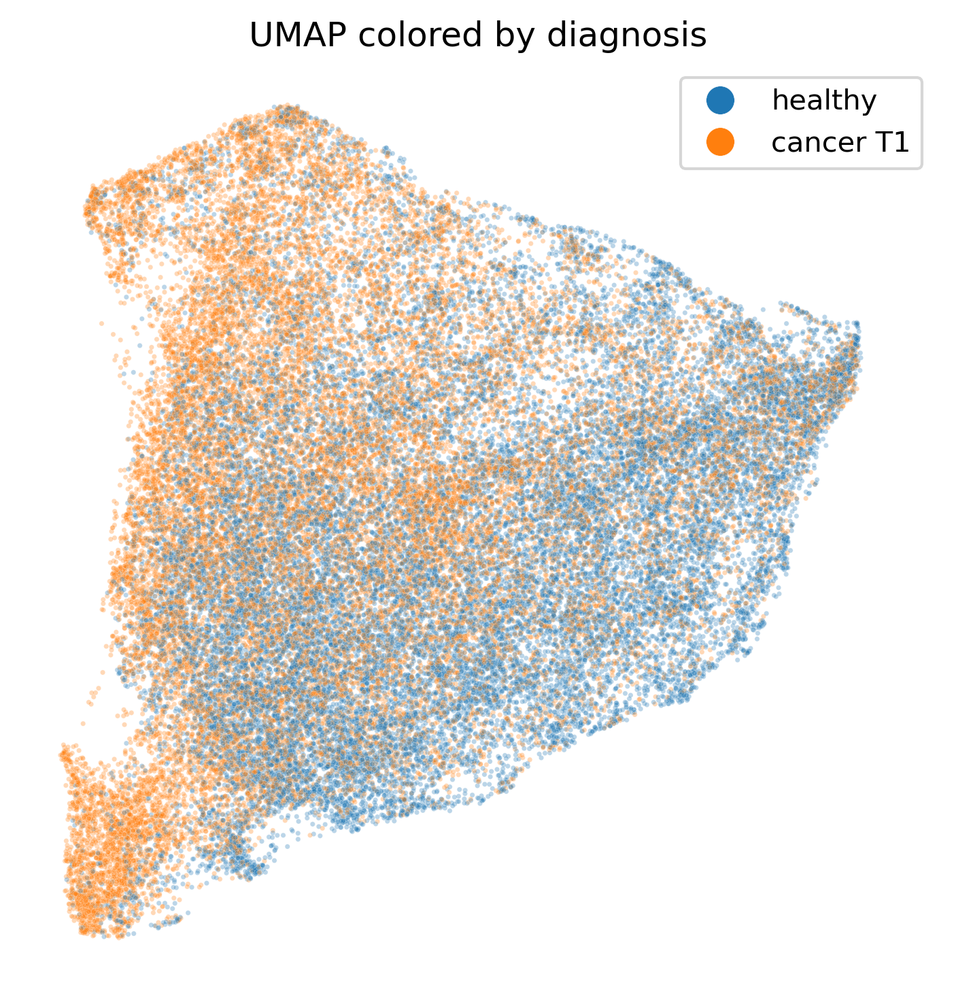

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=300)
m = 'diagnosis'
g = sns.scatterplot(data=df, x='umap_x', y='umap_y', hue=m, s=3, alpha=0.3, ax=ax, hue_order=ho if m == 'patient' else None)
ax.set_title(f'UMAP colored by {m}')
ax.axis('square')
ax.axis('off')
sns.move_legend(g, 'best', title=None)

for lh in g.legend_.legend_handles: 
    lh.set_alpha(1)
    lh.set_markersize(10)

fig.tight_layout()

### Fig. S1a

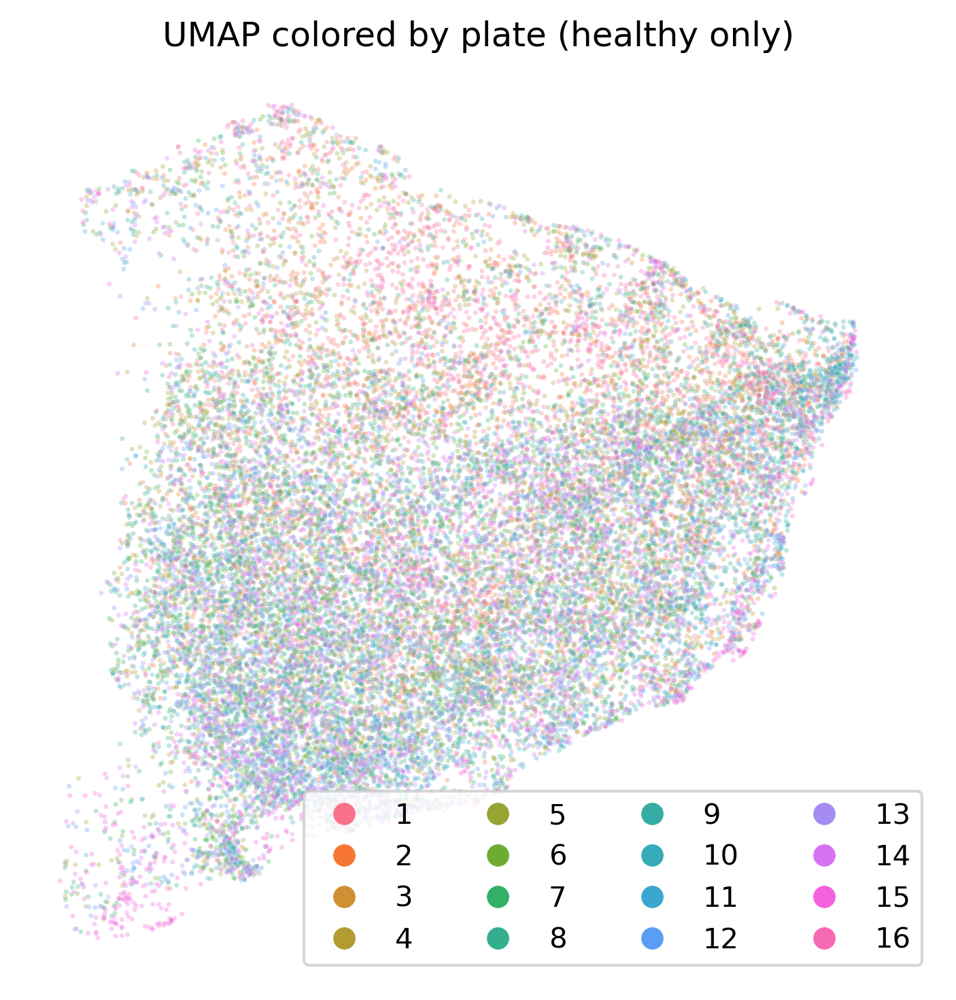

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=300)
m = 'plate healthy'
g = sns.scatterplot(data=df, x='umap_x', y='umap_y', hue=m, s=3, alpha=0.3, ax=ax, hue_order=ho if m == 'patient' else None)
ax.set_title(f'UMAP colored by plate (healthy only)')
ax.axis('square')
ax.axis('off')
sns.move_legend(g, 'best', ncol=4, title=None)

for lh in g.legend_.legend_handles: 
    lh.set_alpha(1)
    lh.set_markersize(8)

fig.tight_layout()

### Fig. S1b

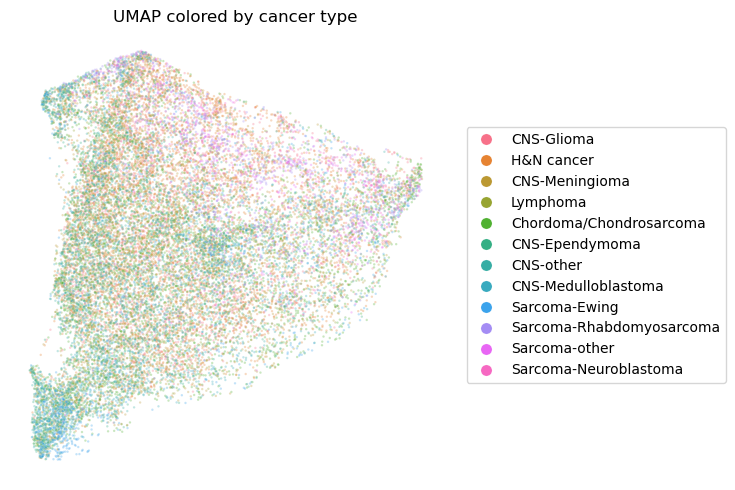

In [9]:
fig, ax = plt.subplots(1, 1, figsize=(9, 5))
m = 'group'
g = sns.scatterplot(data=df, x='umap_x', y='umap_y', hue=m, s=3, alpha=0.3, ax=ax, hue_order=ho if m == 'patient' else None)
ax.set_title(f'UMAP colored by cancer type')
ax.axis('square')
ax.axis('off')
sns.move_legend(g, 'center left', bbox_to_anchor=(1, 0.5), title=None)

for lh in g.legend_.legend_handles: 
    lh.set_alpha(1)
    lh.set_markersize(8)

fig.tight_layout()

## All timepoint UMAPs

In [10]:
df = data.info.copy()
np.random.seed(12412)

for plate in trange(1, 17):
    print('plate', plate, '*' * 80)
    vis_idx_c = []
    pats = df[df['plate'] == plate]['patient'].unique()
    for p in pats:
        if p[0] == 'H':
            continue
        for t in [1, 2, 3, 4, 5]:
            idx = df[(df['patient'] == p) & (df['time'] == t) & (df['plate'] == plate)].index
            if len(idx) > 200:
                vis_idx_c.append(np.random.choice(idx, size=200, replace=False))
    print(len(vis_idx_c))

    vis_idx_h = []
    for p in pats:
        if p[0] == 'P':
            continue
        idx = df[(df['patient'] == p) & (df['time'] <= 1)& (df['plate'] == plate)].index
        if len(idx) > 400:
            vis_idx_h.append(np.random.choice(idx, size=400, replace=False))
    print(len(vis_idx_h))
    vis_idx = np.concatenate(vis_idx_c + vis_idx_h)
    print(len(vis_idx))

    np.random.shuffle(vis_idx)

    feat_umap = UMAP(random_state=123).fit_transform(res_zs[vis_idx])
    print(feat_umap.shape)
    df.loc[vis_idx, ['umap_x', 'umap_y']] = feat_umap

  0%|                                                                                                                                                                                          | 0/16 [00:00<?, ?it/s]

plate 1 ********************************************************************************
29
5
7800


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
  6%|███████████▏                                                                                                                                                                      | 1/16 [00:15<03:51, 15.45s/it]

(7800, 2)
plate 2 ********************************************************************************
39
4
9400


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 12%|██████████████████████▎                                                                                                                                                           | 2/16 [00:33<03:58, 17.05s/it]

(9400, 2)
plate 3 ********************************************************************************
24
1
5200


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 19%|█████████████████████████████████▍                                                                                                                                                | 3/16 [00:45<03:12, 14.83s/it]

(5200, 2)
plate 4 ********************************************************************************
42
4
10000


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 25%|████████████████████████████████████████████▌                                                                                                                                     | 4/16 [01:05<03:19, 16.63s/it]

(10000, 2)
plate 5 ********************************************************************************
22
2
5200


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 31%|███████████████████████████████████████████████████████▋                                                                                                                          | 5/16 [01:16<02:42, 14.78s/it]

(5200, 2)
plate 6 ********************************************************************************
42
4
10000


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 38%|██████████████████████████████████████████████████████████████████▊                                                                                                               | 6/16 [01:36<02:43, 16.40s/it]

(10000, 2)
plate 7 ********************************************************************************
44
4
10400


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 44%|█████████████████████████████████████████████████████████████████████████████▉                                                                                                    | 7/16 [01:46<02:10, 14.47s/it]

(10400, 2)
plate 8 ********************************************************************************
39
4
9400


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 50%|█████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 8/16 [02:05<02:07, 15.95s/it]

(9400, 2)
plate 9 ********************************************************************************
35
4
8600


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 56%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 9/16 [02:22<01:53, 16.26s/it]

(8600, 2)
plate 10 ********************************************************************************
40
4
9600


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 10/16 [02:41<01:41, 16.94s/it]

(9600, 2)
plate 11 ********************************************************************************
30
2
6800


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 11/16 [02:55<01:20, 16.04s/it]

(6800, 2)
plate 12 ********************************************************************************
44
4
10400


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 12/16 [03:06<00:58, 14.52s/it]

(10400, 2)
plate 13 ********************************************************************************
44
4
10400


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 13/16 [03:16<00:39, 13.28s/it]

(10400, 2)
plate 14 ********************************************************************************
41
4
9800


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 14/16 [03:35<00:30, 15.01s/it]

(9800, 2)
plate 15 ********************************************************************************
40
3
9200


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 15/16 [03:54<00:16, 16.04s/it]

(9200, 2)
plate 16 ********************************************************************************
28
3
6800


/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/local_home/hschluet/anaconda3/envs/img-39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [04:08<00:00, 15.52s/it]

(6800, 2)


### Fig. S1c

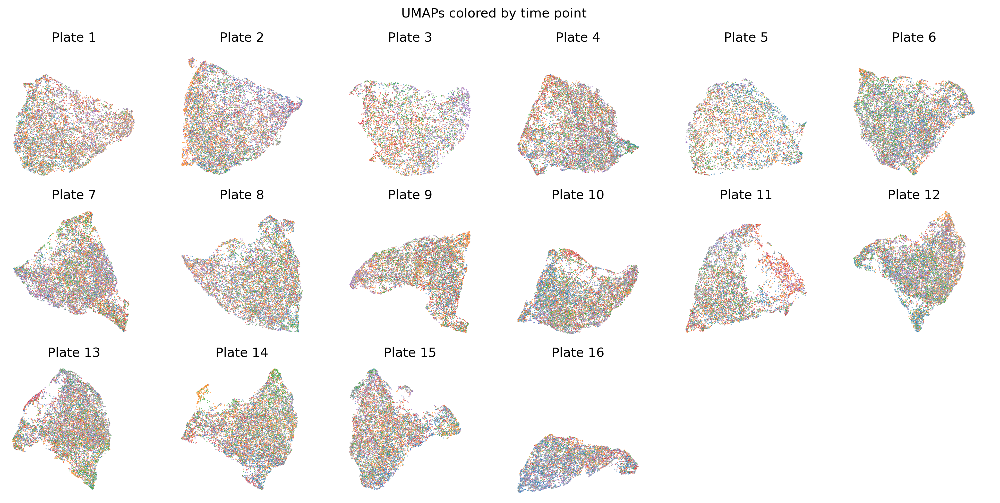

In [11]:
fig, axs = plt.subplots(3, 6, figsize=(2.2*6, 2.2*3), dpi=300)

for plate, ax in zip(range(1, 17), axs.flatten()):
    g = sns.scatterplot(data=df[df['plate'] == plate], x='umap_x', y='umap_y', hue='time', s=1, alpha=0.7, ax=ax, 
                        palette={0 : '#7d7f7c', 1 : '#1f77b4', 2 : '#ff7f0e', 3 : '#2ca02c', 4 : '#d62728', 5 : '#9467bd'})
    ax.set_title(f'Plate {plate}')
    ax.axis('square')
    ax.axis('off')
    # sns.move_legend(g, 'best', title=None, markerscale=5)
    ax.get_legend().remove()

axs.flatten()[-1].axis('off')
axs.flatten()[-2].axis('off')
fig.suptitle('UMAPs colored by time point')
fig.tight_layout()

### Fig. S1d

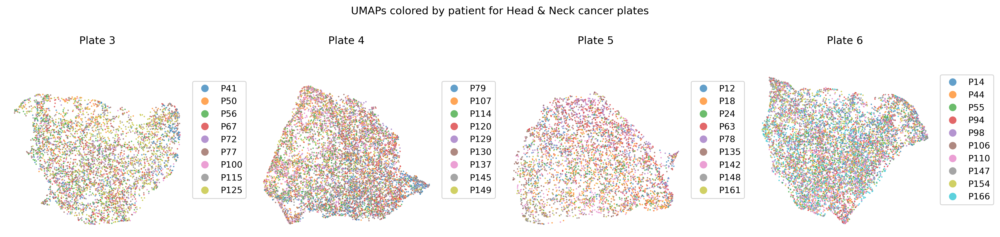

In [12]:
fig, axs = plt.subplots(1, 4, figsize=(4*4, 4), dpi=300)


for plate, ax in zip([3, 4, 5, 6], axs.flatten()):
    ho = df[(df['plate'] == plate) & (df['time'] >= 1)]['patient'].unique()
    pids = [int(p[1:]) + 1000 * (p[0] == 'H') for p in ho]
    ho = ho[np.argsort(pids)]

    g = sns.scatterplot(data=df[(df['plate'] == plate) & (df['time'] >= 1)], x='umap_x', y='umap_y', hue='patient', s=3, alpha=0.7, ax=ax, 
                        hue_order=ho)
    ax.set_title(f'Plate {plate}')
    ax.axis('square')
    ax.axis('off')
    # sns.move_legend(g, 'best', title=None, markerscale=5)
    sns.move_legend(g, 'center left', bbox_to_anchor=(1, 0.5), title=None, markerscale=5)
    # ax.get_legend().remove()

    fig.suptitle('UMAPs colored by patient for Head & Neck cancer plates')
    fig.tight_layout()